In [4]:
# written to merge networks from drugs
# associated with the same DMEs
# re-written 9-18-19, JLW

import pickle,os,csv,itertools,functools
import networkx as nx
from collections import defaultdict
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from networkx.drawing.nx_agraph import graphviz_layout, to_agraph
import pygraphviz as pgv
from pyvis.network import Network
# import plotly.graph_objects as go


rscs_dir = '../rscs/'
data_dir = '../data/'
dme_mdir = os.path.join(data_dir,'dme_merged_data')

dd_dic = functools.partial(defaultdict, dict)

true_positives_dbid = pickle.load(open(os.path.join(data_dir,'true_positives_dbid.pkl'),'rb'))
dintf = os.path.join(rscs_dir,'drug_intome_targets.pkl')
dint = pickle.load(open(dintf,'rb')) # to find number of drug targets

db2nf = os.path.join(rscs_dir,'drugbankid_to_name.pkl')
db2n = pickle.load(open(db2nf,'rb'))

In [2]:
def pairwise(iterable):
    a,b = itertools.tee(iterable)
    next(b,None)
    return zip(a,b)

In [3]:
# dictionary to look up drug network results
nfdir = os.path.join(data_dir,'all_drugbank_network_files/')
nfs = [f for f in os.listdir(nfdir)]
nf_dic = dict([(f.split('_')[0],f) for f in nfs if 'merged_neighborhood_.txt' in f])
print('loaded network files')

loaded network files


Myopathy


/Users/jenwilson/anaconda2/envs/DME_networks_environment/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


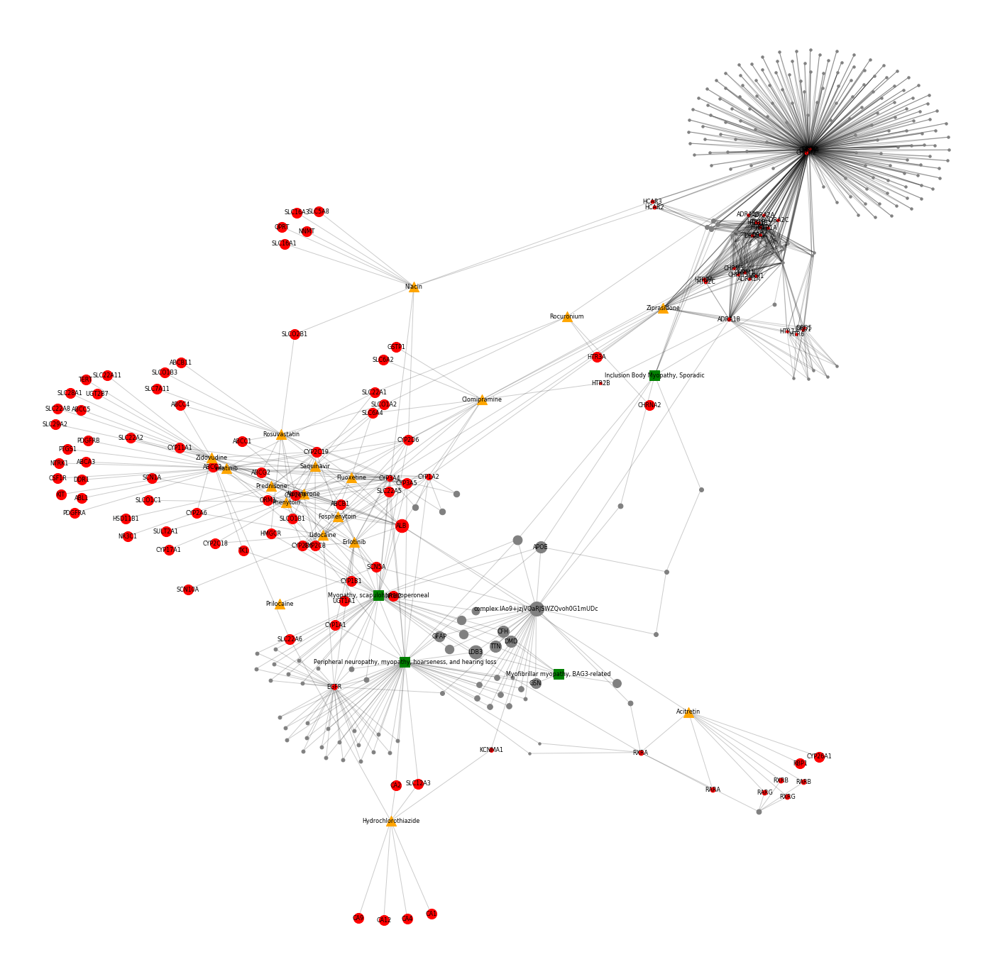

Hemorrhage


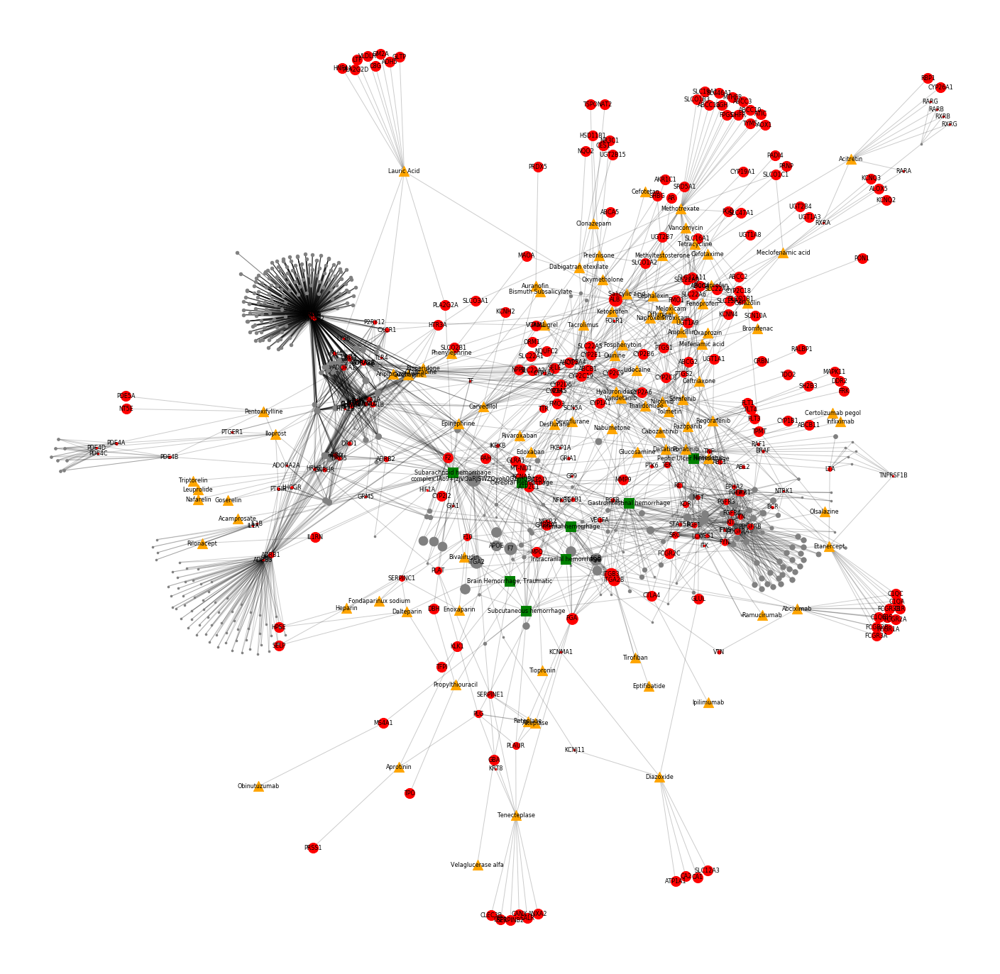

Pneumonia


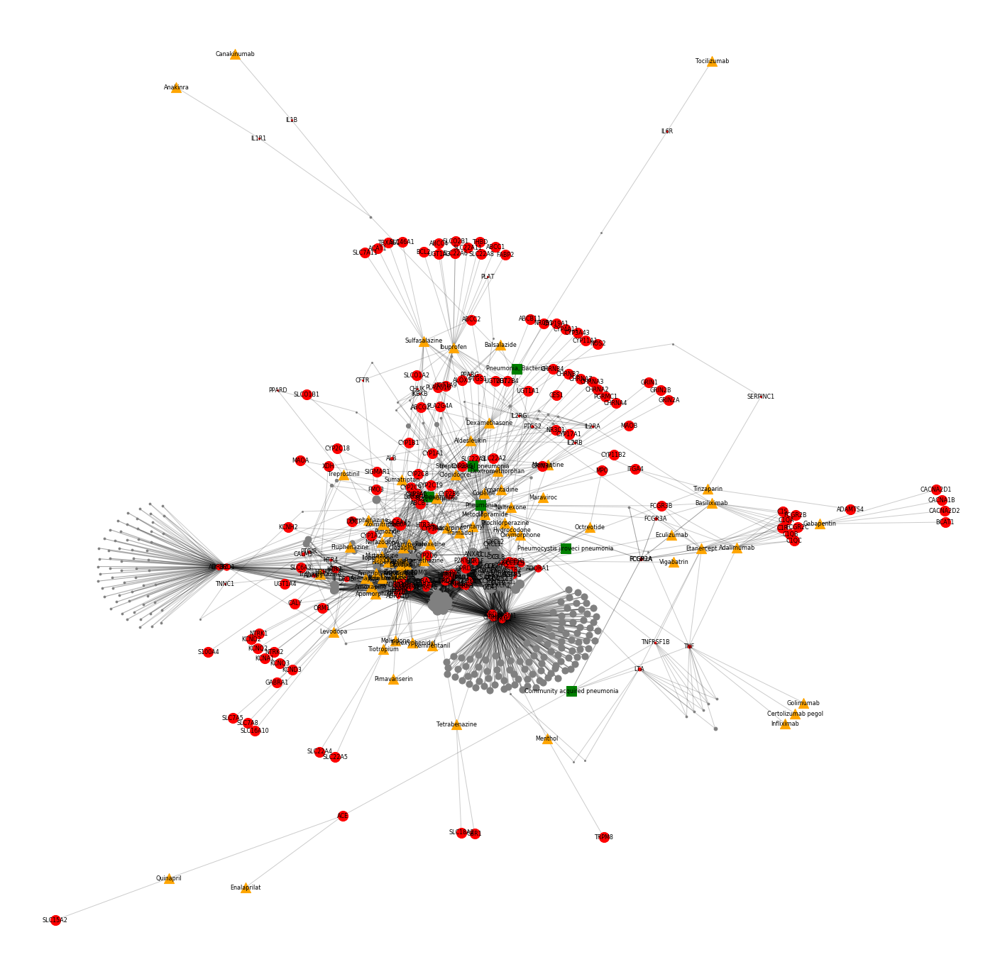

Hypertension


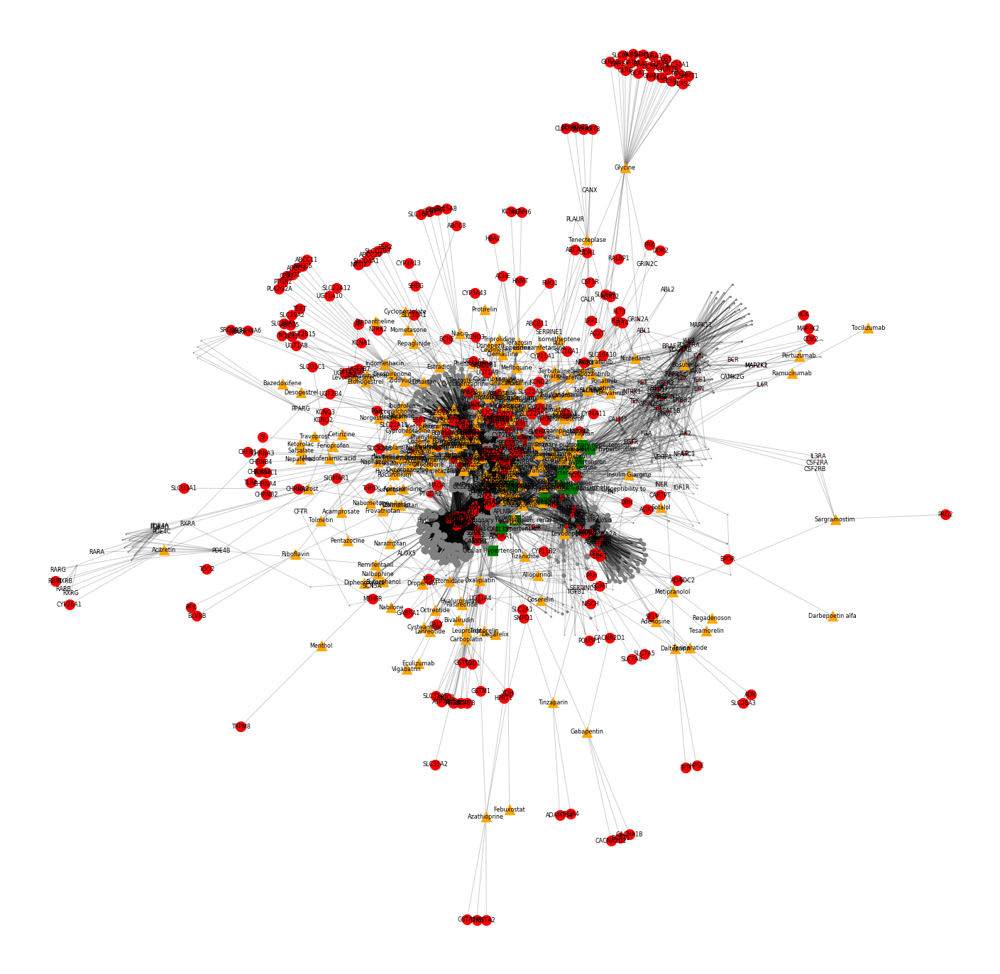

Tardive dyskinesia


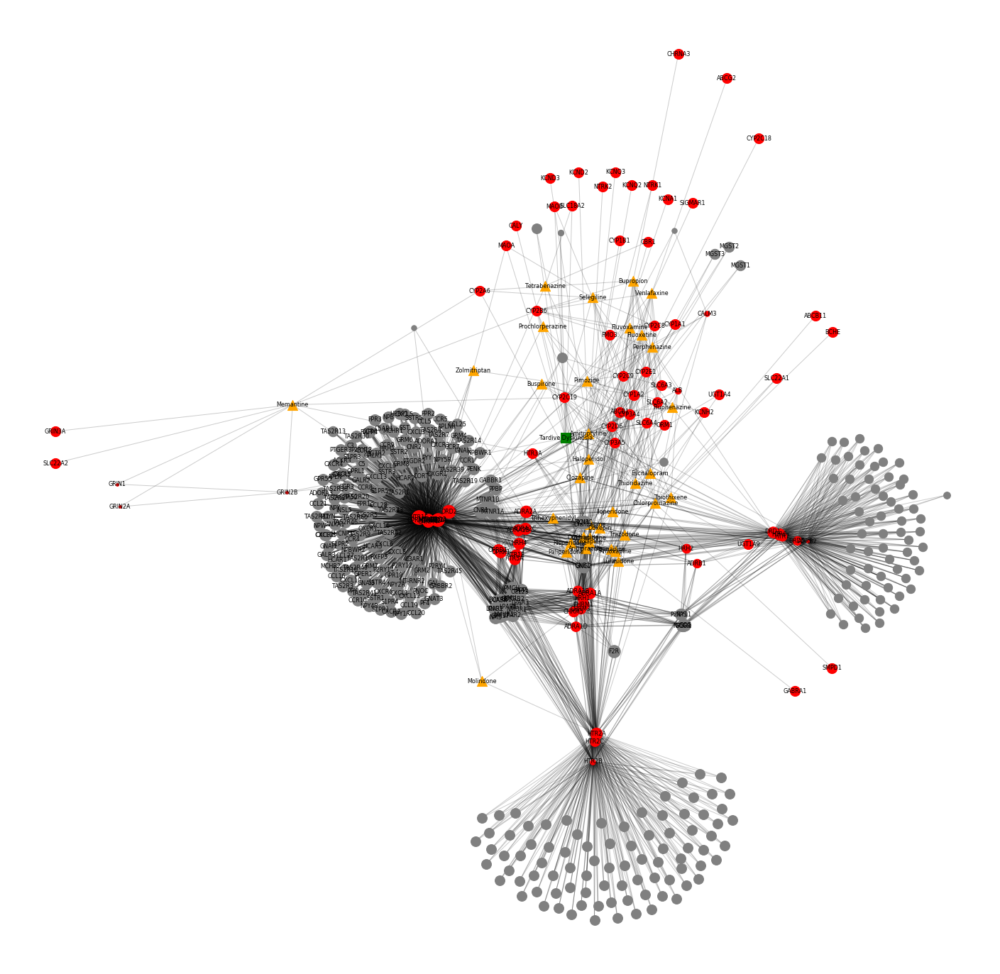

Cerebral infarction


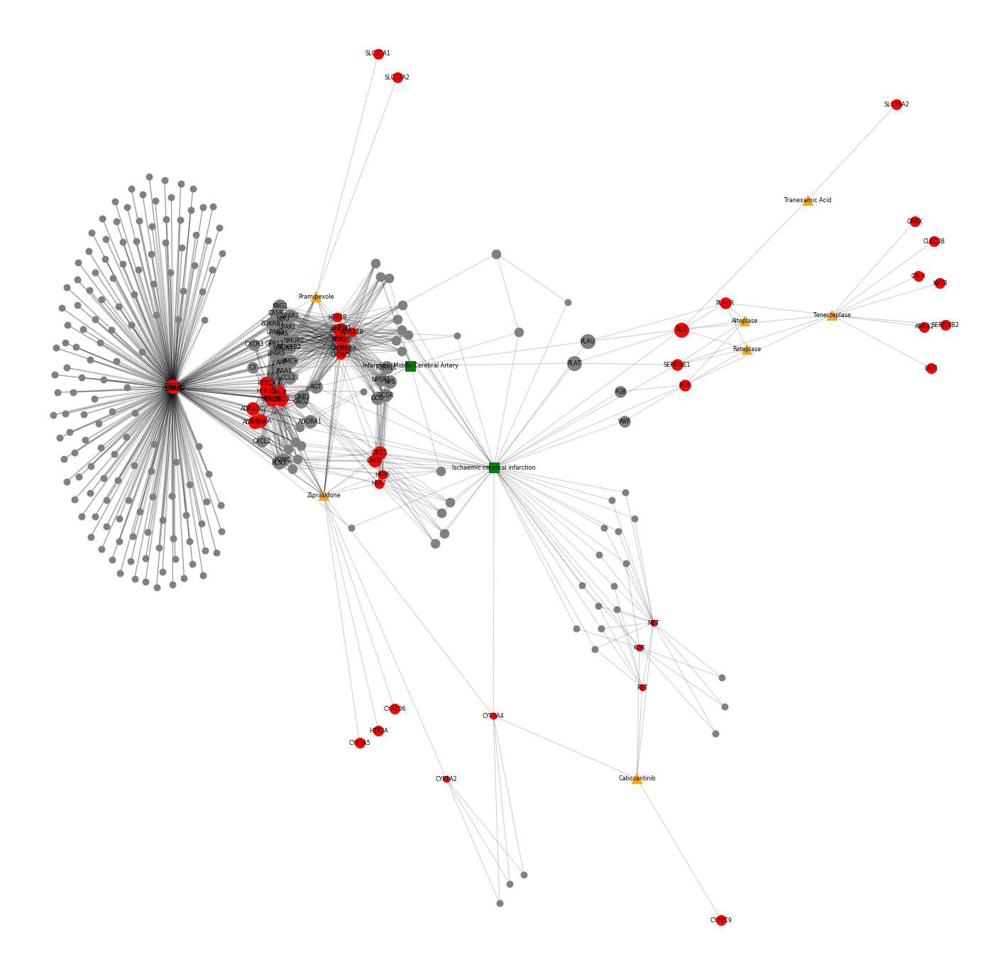

Hemolytic anemia


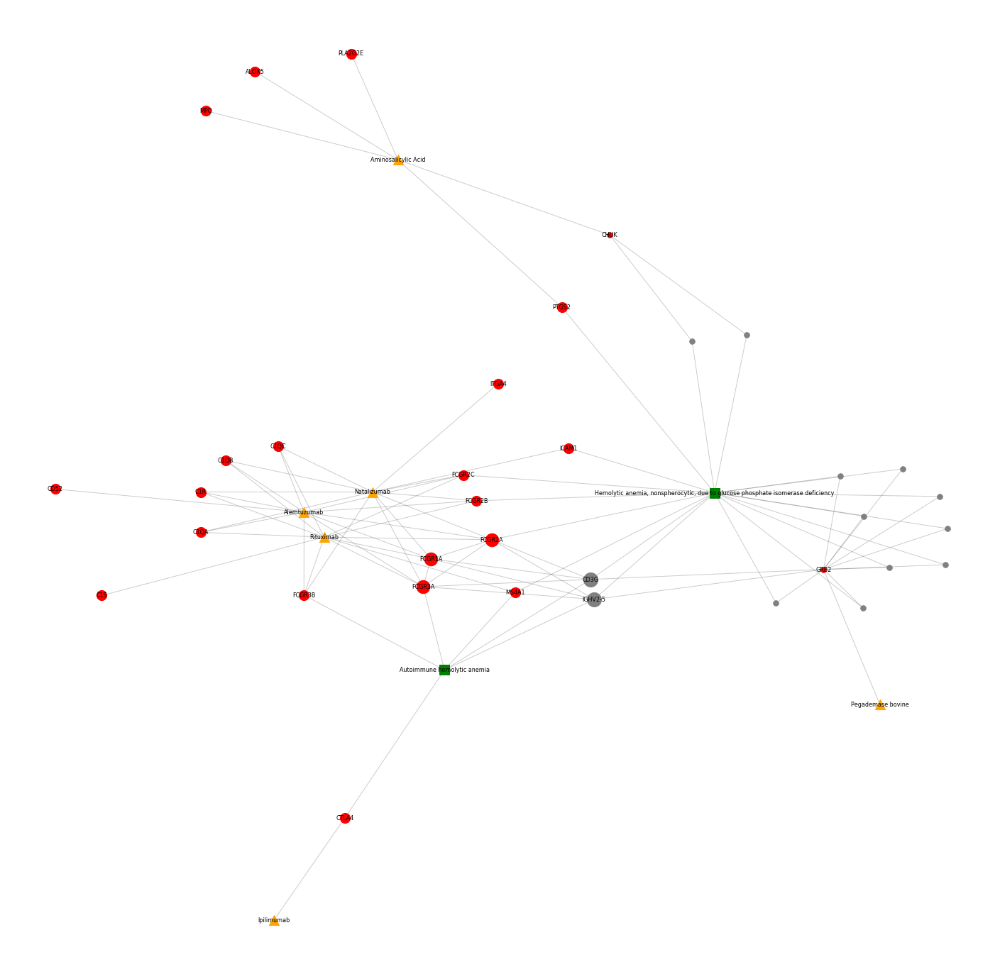

Pancreatitis


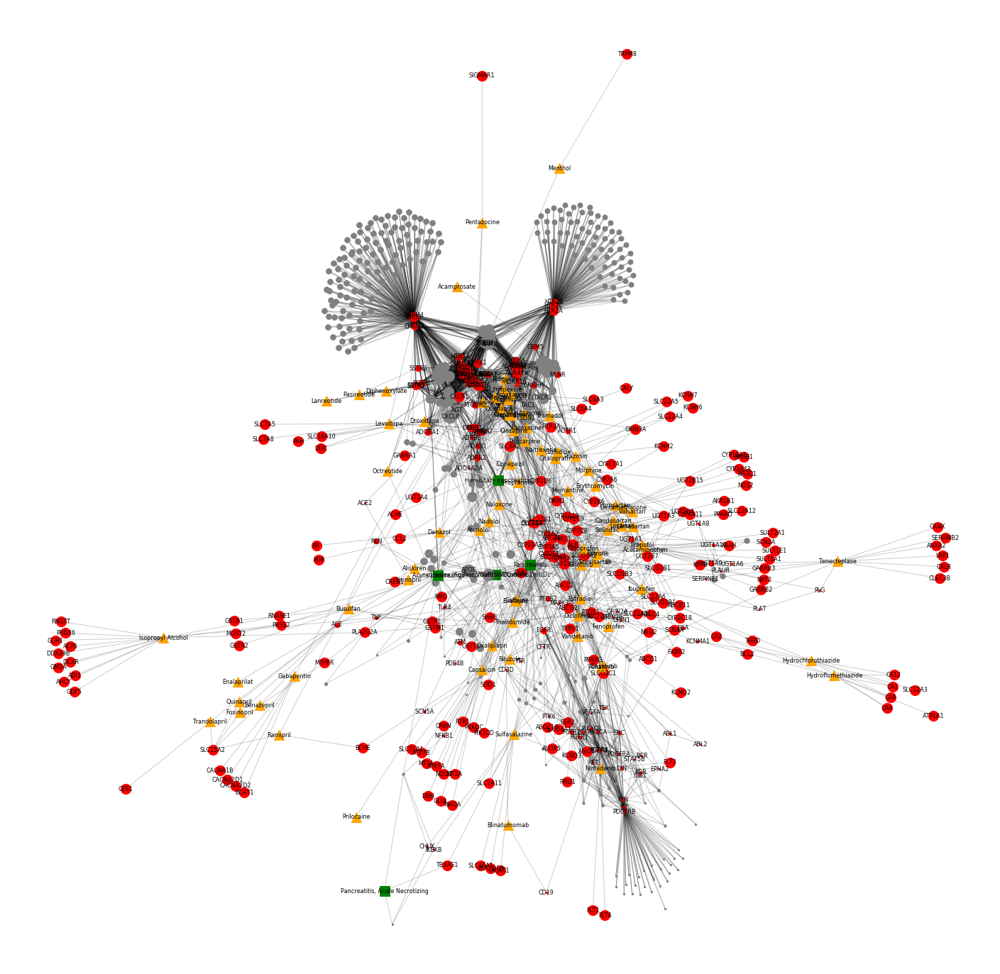

Sepsis


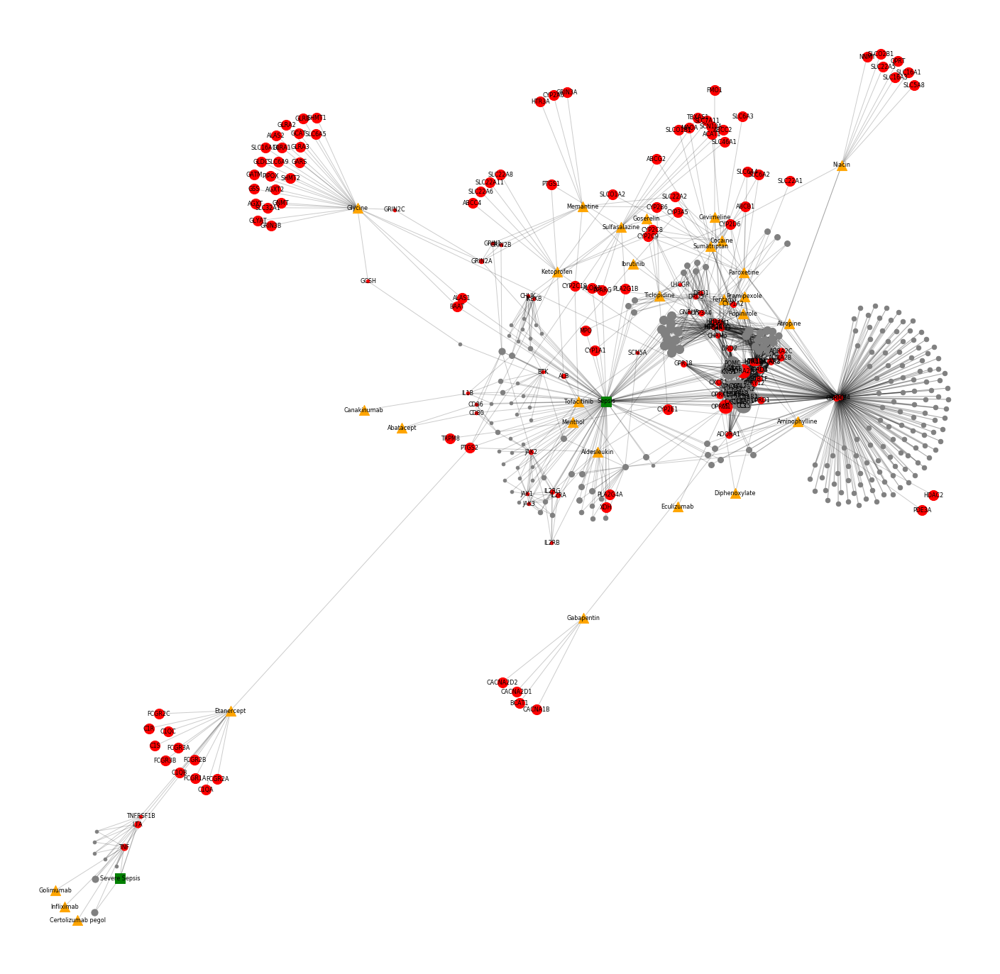

Peripheral neuropathy


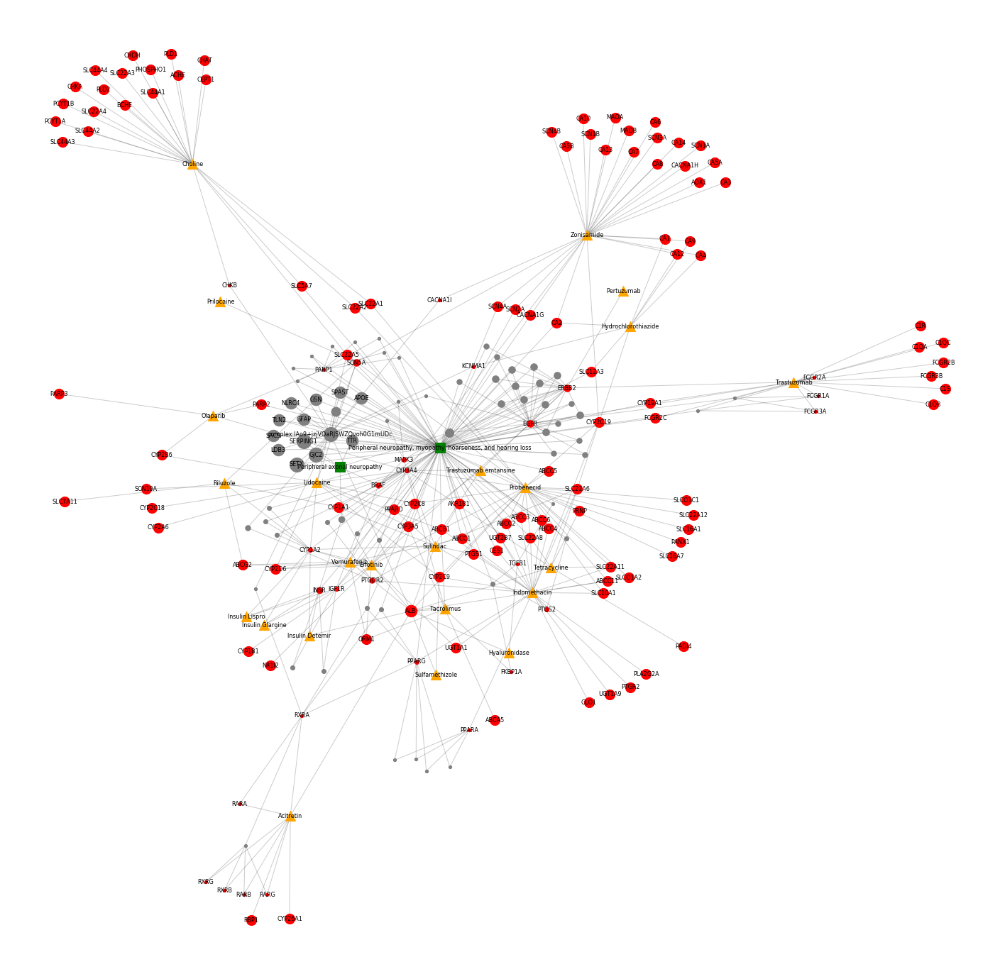

Gastric ulcer


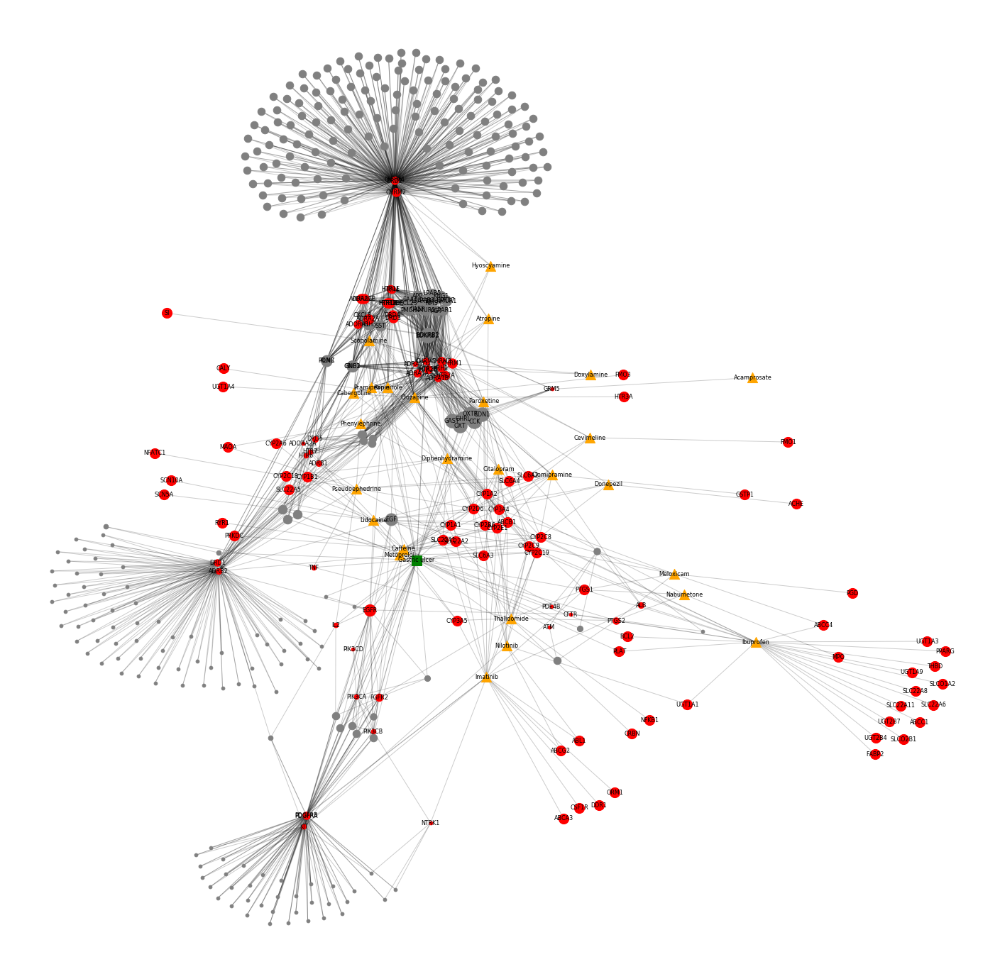

Hyperlipidemia


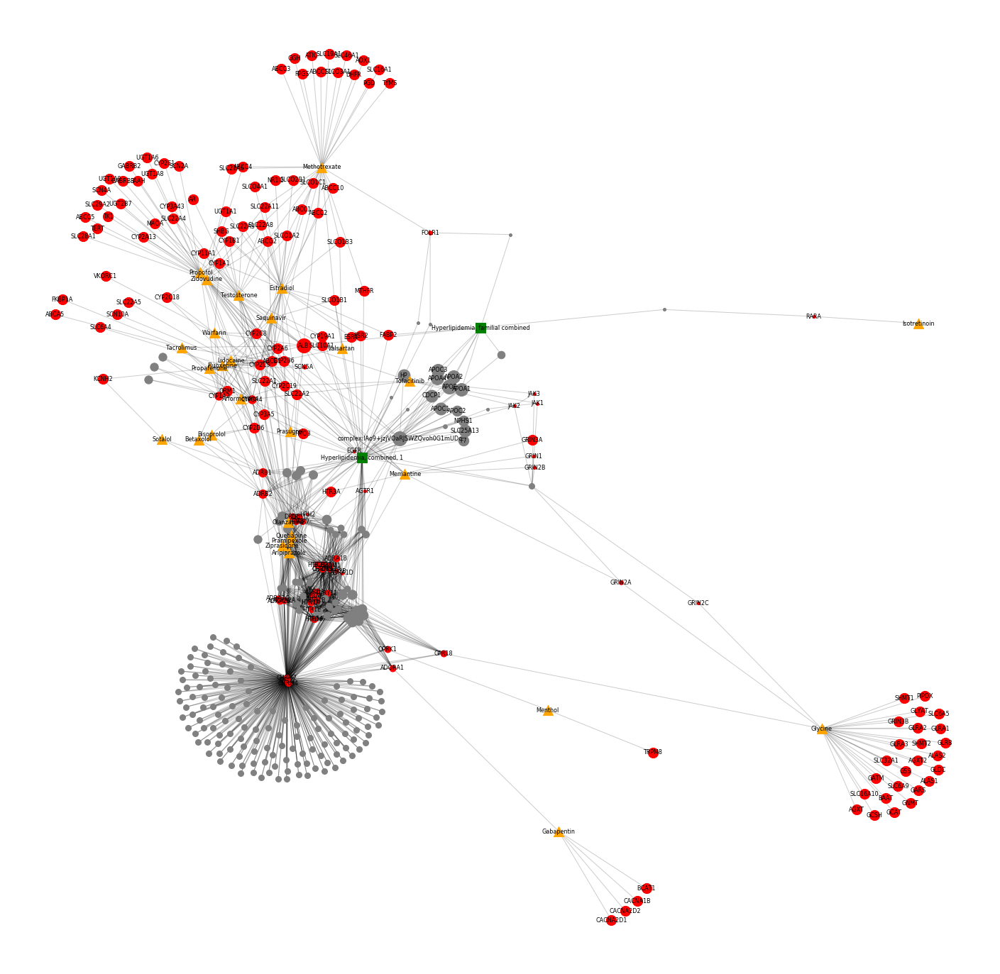

Myocardial infarction


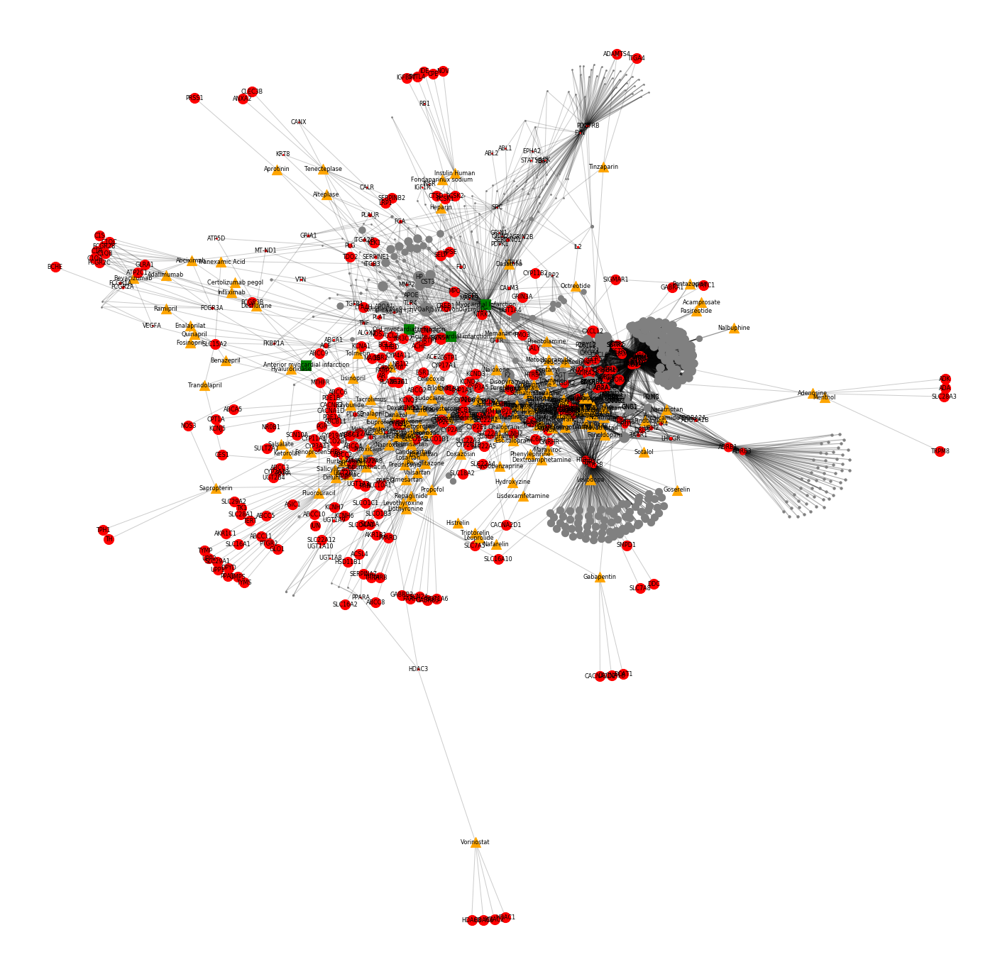

Edema


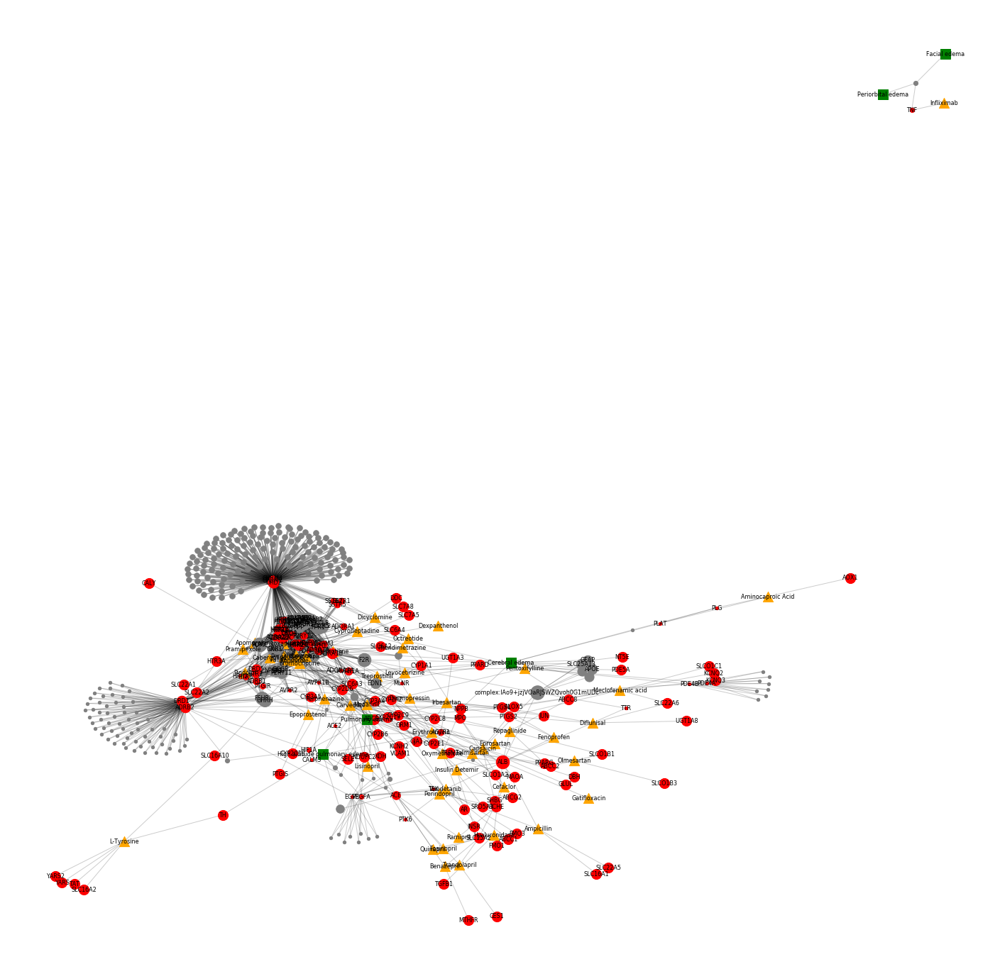

Deep vein thrombosis


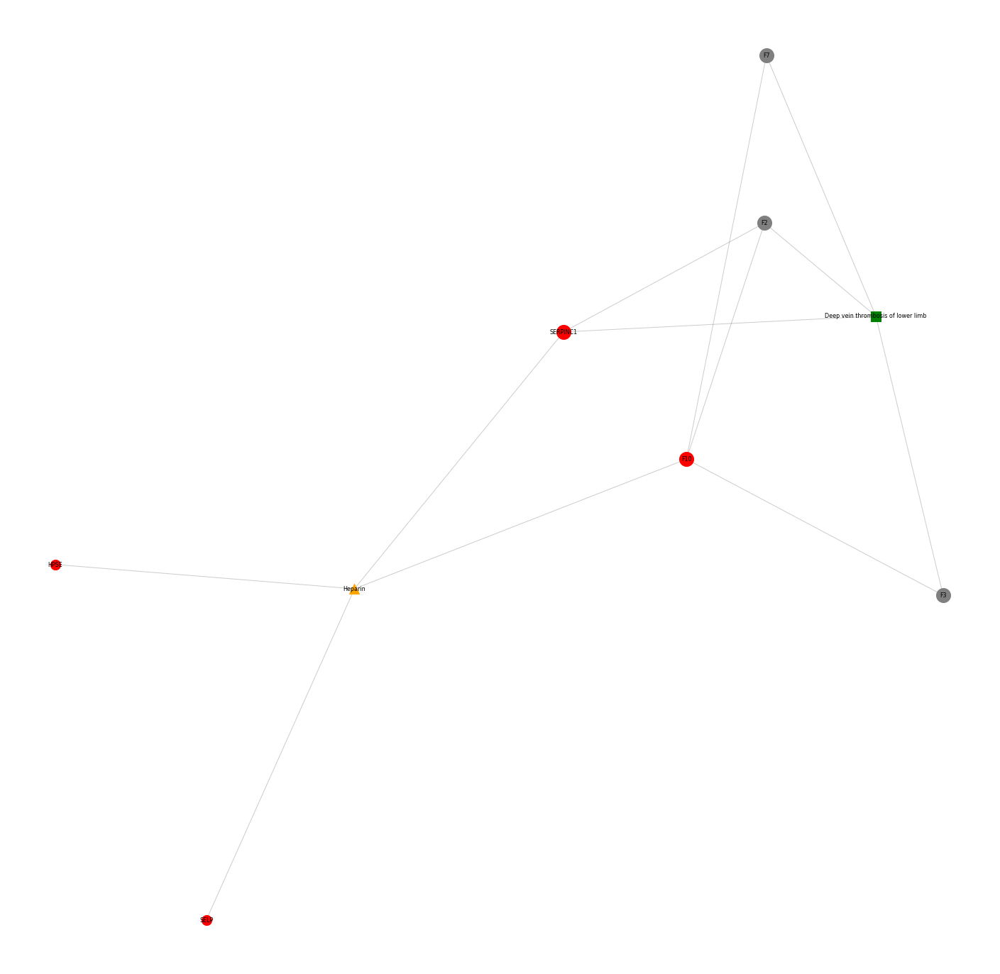

Thrombocytopenia


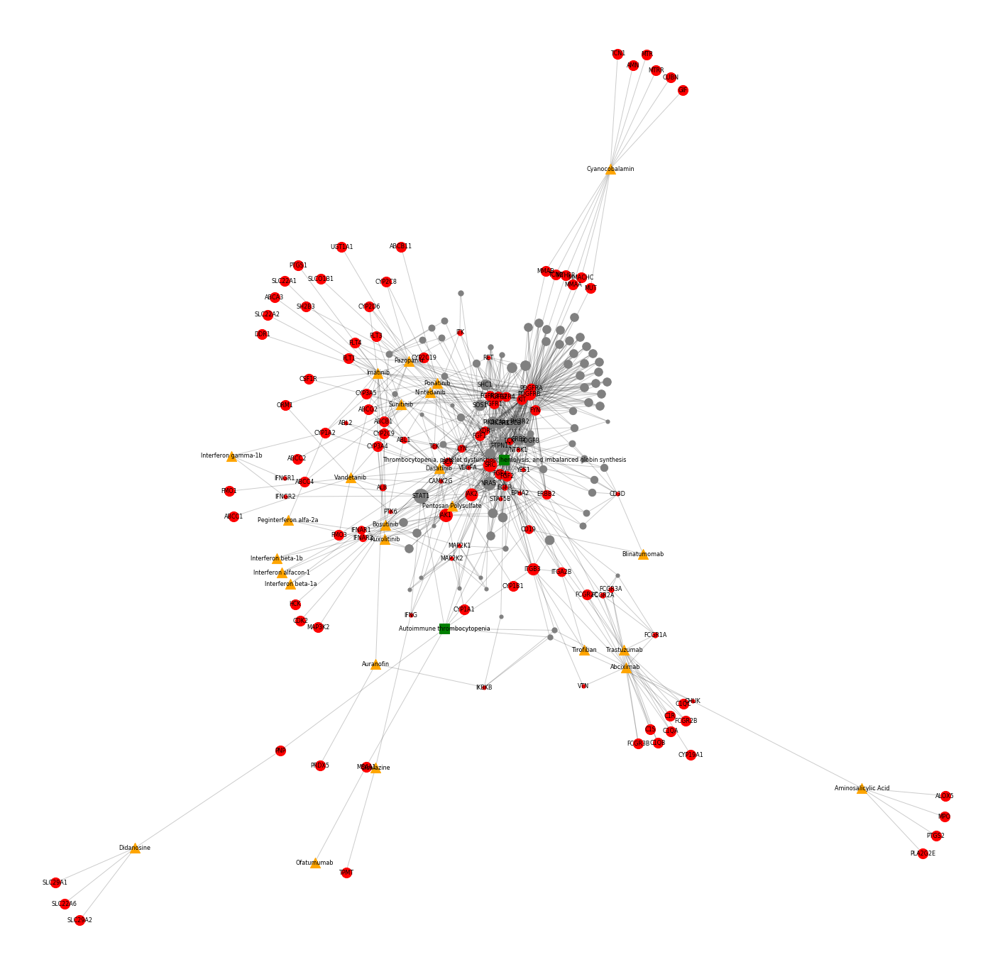

Interstitial lung disease


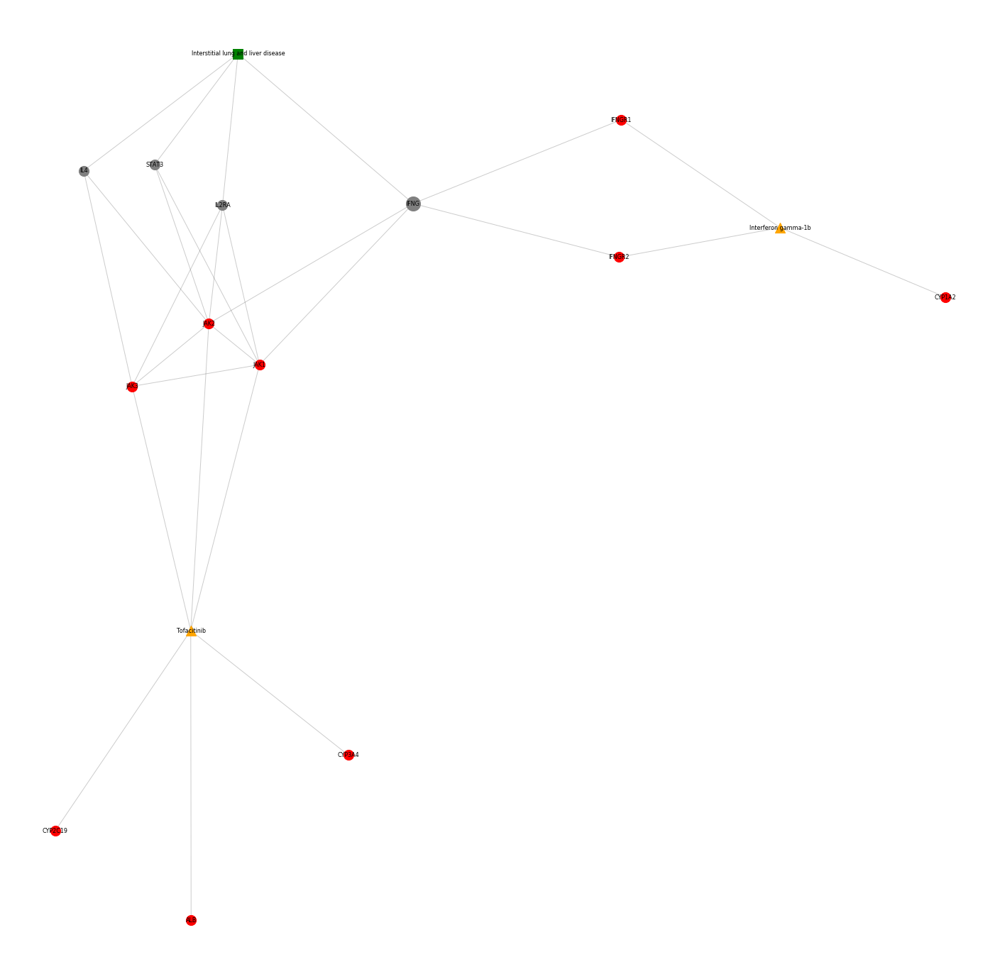

Pulmonary edema


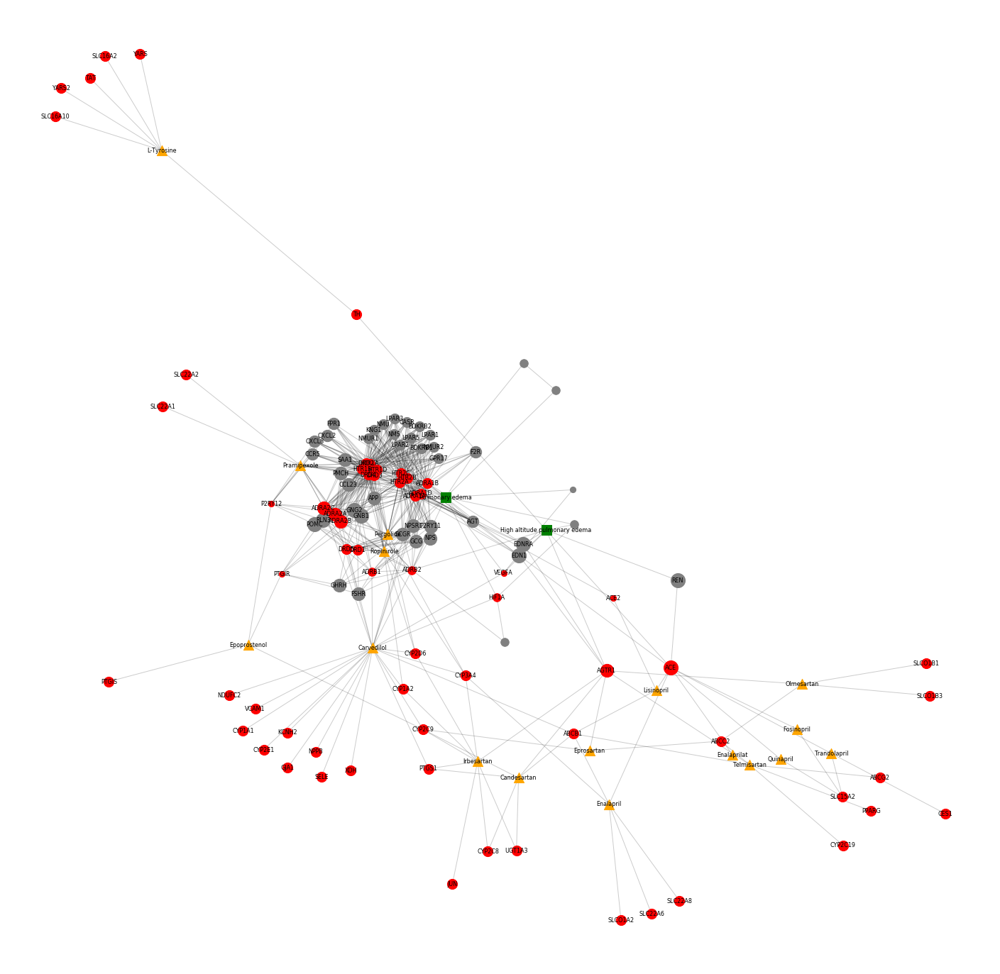

Delirium


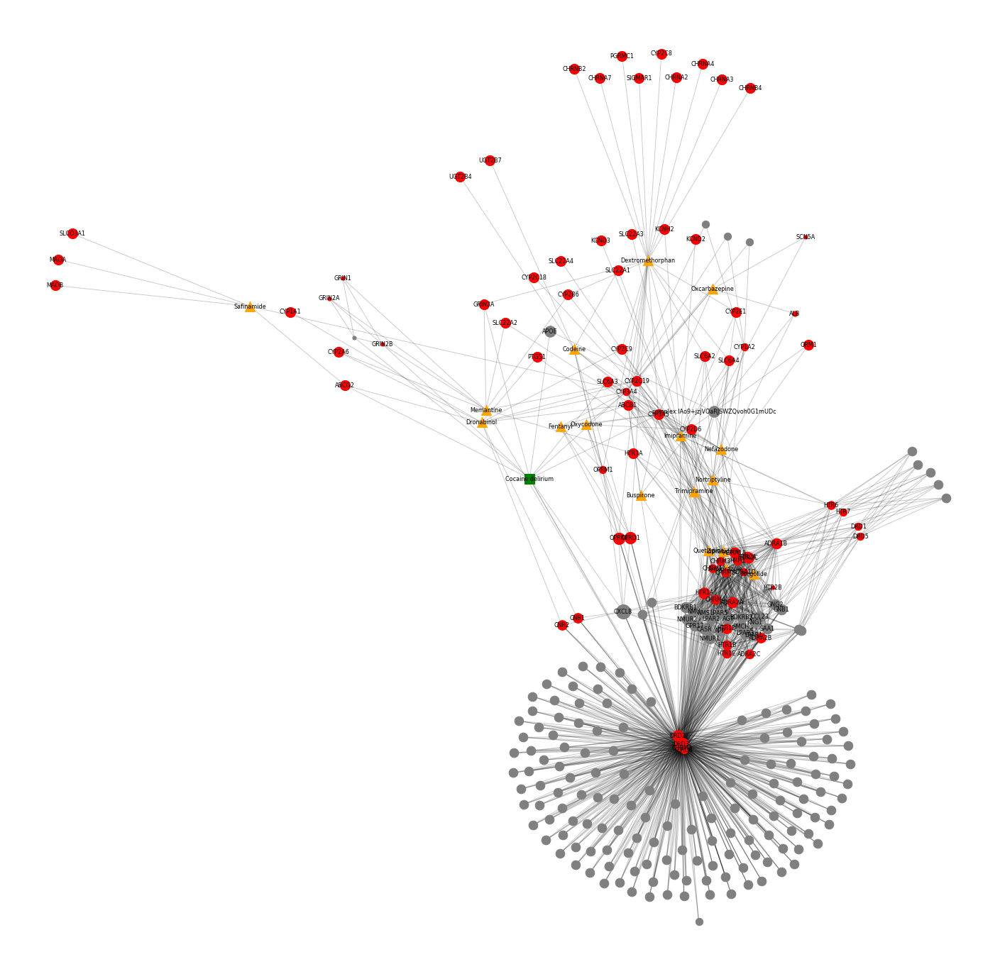

Proteinuria


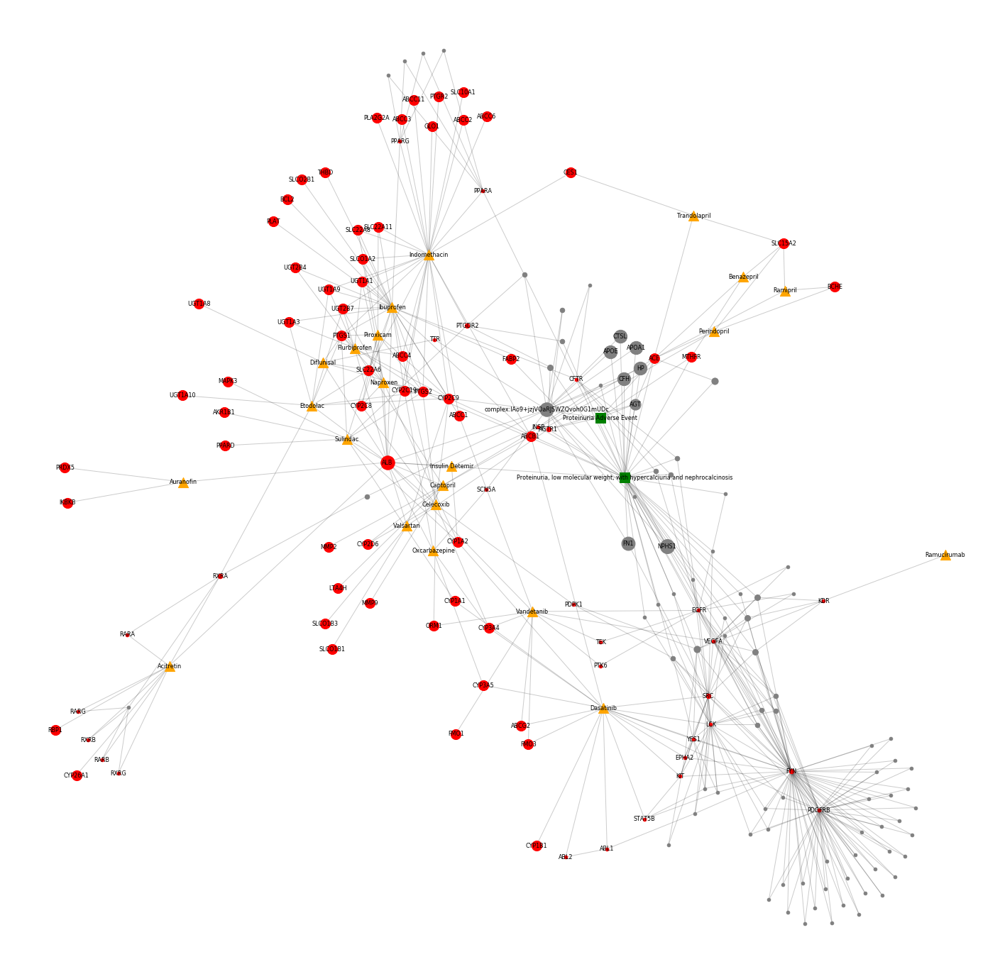

Ventricular tachycardia


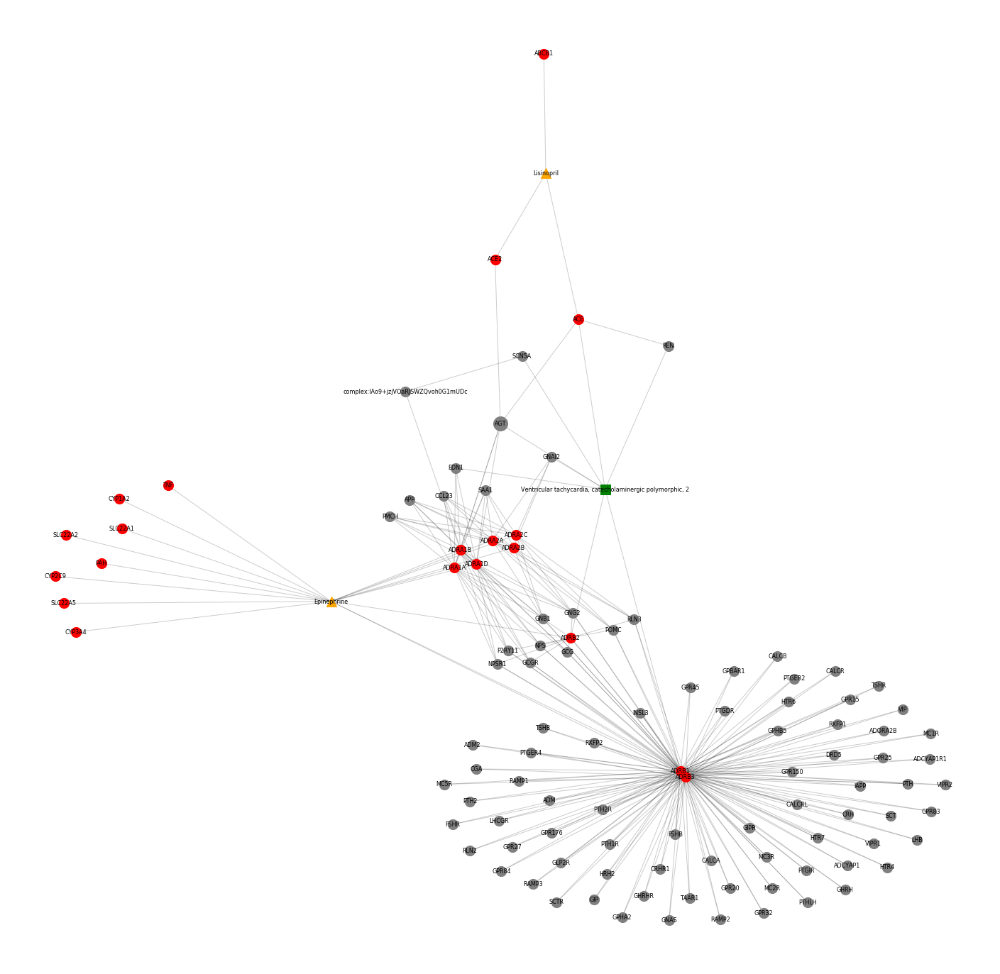

Cardiac arrest


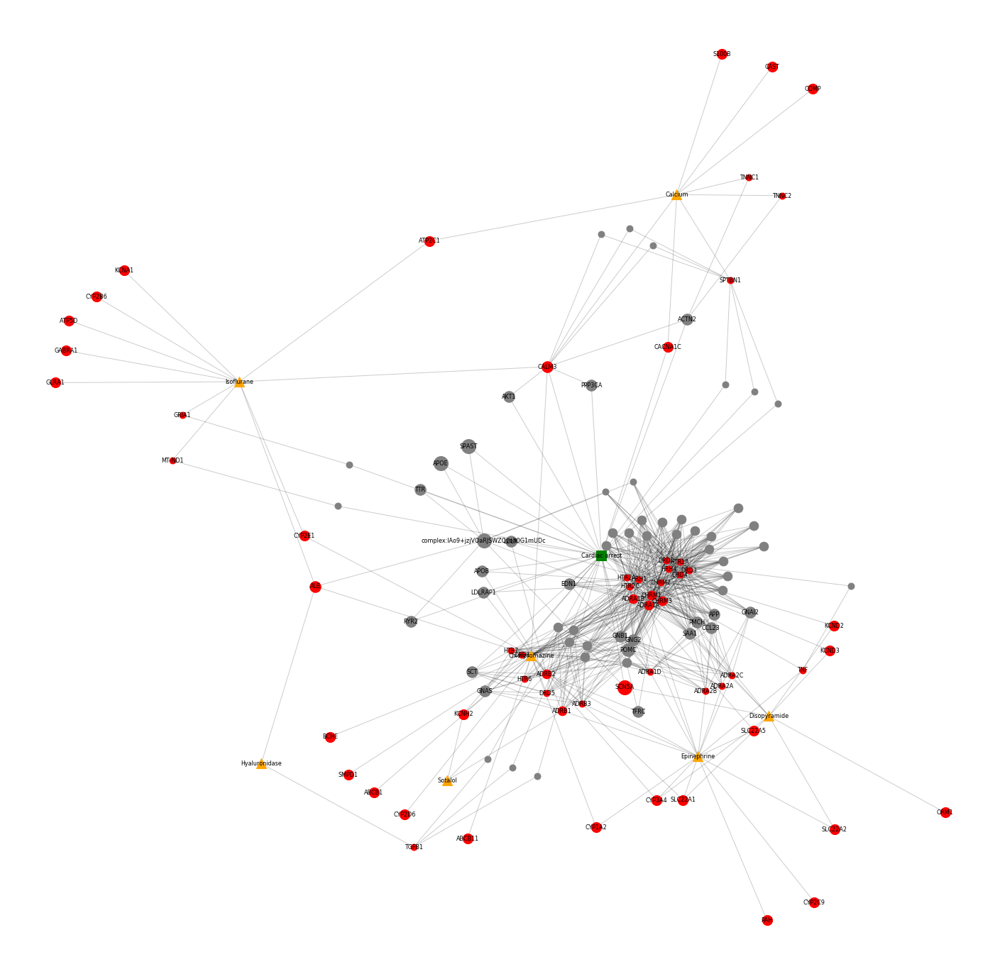

Hepatic necrosis


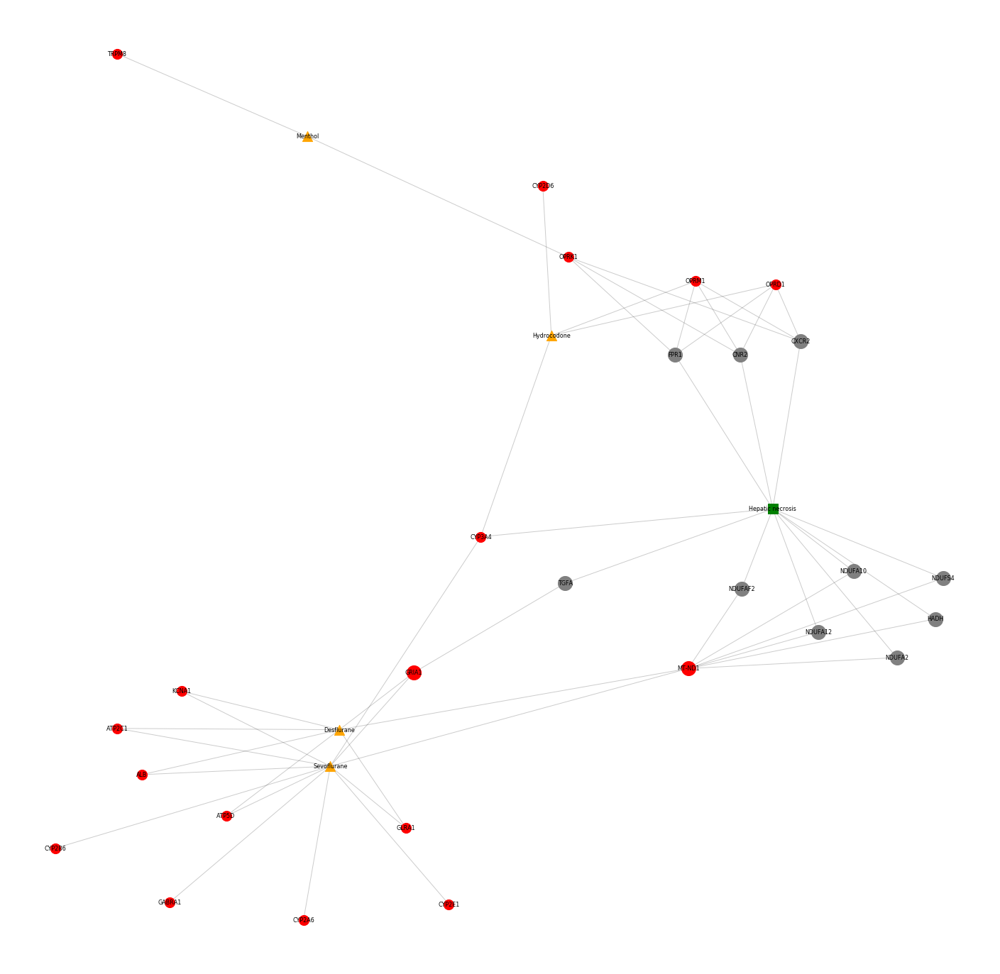

Agranulocytosis


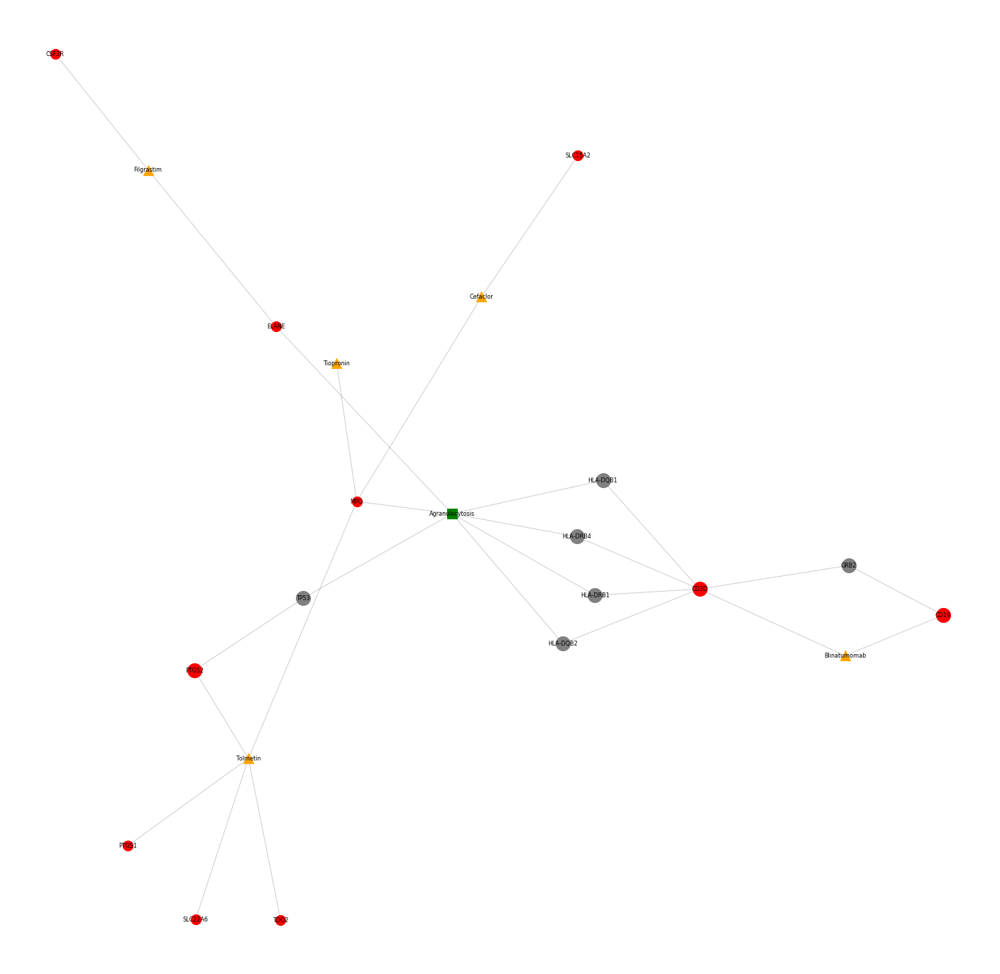

In [5]:
writer = pd.ExcelWriter(open('DME_merged_node_counts.xlsx','wb'))
top_dme_genes = defaultdict(dd_dic)
num_top=12
all_node_types = {}
for (dme,dbid_list) in true_positives_dbid.items():
# dme_short = [x for x in true_positives_dbid.items()][0:2]
# for (dme,dbid_list) in dme_short:
    num_drugs_to_dme = len(dbid_list)
    data_for_df = []
    print(dme)
    node_counts = defaultdict(int)
    node_types = {}
    dme_edges = set()
    dme_nodes = set()
    in_which_pathways = defaultdict(set)
    for (dbid,ph,genes) in dbid_list: # loop through each time a drug is associated with a dme-associated pathfx phenotype
        # print(dname)
        dname = db2n[dbid]
        netfile = nf_dic[dbid]
        
        # load network
        G=nx.read_edgelist(os.path.join(nfdir,netfile),delimiter='\t',data=(('weight',float),),nodetype=str)
        G.remove_node('')
        
        # load genes in network associated with tox phenotype
        rel_genes = genes.split(',') 
        
        # find drug binding targets
        dtargs = dint[dbid]
        
        # get all shortest paths between drug targets and phenotype-genes
        drug_edges = set()
        drug_nodes = set()
        for dt in dtargs:
            for g in rel_genes:
                if dt in G and g in G:
                    if nx.has_path(G,dt,g):
                        aspths = [p for p in nx.all_shortest_paths(G,source=dt,target=g)]
                        for short_pth in aspths:
                            ind_edges = pairwise(short_pth)
                            for (a,b) in ind_edges:
                                drug_nodes.add(a)
                                drug_nodes.add(b)
                                drug_edges.add((a,b))
        
        # add in edges for drug-binding and gene-phenotype for each drug
        node_types[dname] = 'drug'
        all_node_types[dname] = 'drug'
        for dt in dtargs:
            drug_edges.add((dname,dt)) ### Change to drug name
            node_types[dt] = 'drug_target'
            all_node_types[dt] = 'drug_target'
        for g in rel_genes:
            drug_edges.add((g,ph))
            node_types[ph] = 'phenotype'
        # store data for the merged dme network
    
        for n in drug_nodes:
            node_counts[n]+=1 # tally how often a gene connects a drug to a phenotype, regardless of if it's implicated in multiple shortest paths between targets and the phenotype
            in_which_pathways[n].add(dname+':'+ph)
        for (a,b) in drug_edges:
            dme_edges.add((a,b))
            dme_nodes.add(a)
            dme_nodes.add(b)
            
    # format for dme-specific-pandas dataframe
    for (nnode,ncount) in node_counts.items():
        if nnode in node_types:
            nodetype = node_types[nnode]
        else:
            nodetype = 'intermediate' # assume nodes without a type are intermediate proteins
        drug_pathways = ';'.join(list(in_which_pathways[nnode]))
        data_for_df.append([nnode,str(ncount),nodetype,drug_pathways])
    
    # save top genes for all-dme-heatmap
    for (nnode,ncount) in sorted(node_counts.items(),key = lambda x: x[1],reverse=True)[0:num_top]:
        top_dme_genes[nnode][dme] = ncount
        
    # create cytoscape data and/or python graph object for each DME
    # dmeG = nx.Graph()
    
    
    # first interactions
    outf1 = open('_'.join([dme,'merged_all_drugs_network','.txt']),'w')
    for (a,b) in dme_edges:
        outf1.write('\t'.join([a,b,'\n']))
        # dmeG.add_edge(a,b)
    outf1.close()
    
    # second node types
    outf2 = open('_'.join([dme,'node_type','.txt']),'w')
    for (nn,nt) in node_types.items():
        outf2.write('\t'.join([nn,nt,'\n']))    
    outf2.close()
    
    # third node counts
    outf3 = open('_'.join([dme,'node_counts','.txt']),'w')
    max_count = max([v for v in node_counts.values()]) # find the maximum node count
    for (nn,nc) in node_counts.items():
        outf3.write('\t'.join([nn,str(nc),'\n']))
    outf3.close()
    
    df = pd.DataFrame(data_for_df, columns = ['Node Name', 'Node Count','Node Type','Included in these drug pathways'])
    df.to_excel(writer,sheet_name=dme)
    
    # create the graph 
    fig,ax = plt.subplots(figsize=(25,25))
    dmeG = nx.Graph()
    for (a,b) in dme_edges:
        dmeG.add_edge(a,b)
    pos = nx.spring_layout(dmeG)
    ec = nx.draw_networkx_edges(dmeG, pos, alpha=0.2)
    
    # format the graph features
    # node_list = [n for n in dmeG.nodes()] 
    node_list = list(dme_nodes)
    # property mapping
    mapping = {'drug':'orange','drug_target':'red','phenotype':'green','intermediate':'grey'}
    shape_mapping = {'drug':'^','drug_target':'o','phenotype':'s','intermediate':'o'}
    graph_node_types = [node_types[n] if n in node_types else 'intermediate' for n in node_list]
    colors = [mapping[nt] for nt in graph_node_types]
    sizes = [(float(node_counts[n])/max_count)*400 if n in node_counts else 200 for n in node_list]
    shapes = [shape_mapping[nt] for nt in graph_node_types]
    
    # now add each node with relevant properties 
    # pynet = Network(height = 500, width = 500, notebook=True)
    # pynet.add_nodes(node_list,size=sizes,title=["this is an "+ndtype for ndtype in graph_node_types], label=node_list, color=colors)
    # pynet.add_edges(dme_edges)
    for (n,clr,shp,sze,ndtype) in zip(node_list,colors,shapes,sizes,graph_node_types):
        nc = nx.draw_networkx_nodes(dmeG,pos,nodelist=[n],node_color=clr,node_shape=shp,node_size=sze)
        if shp == '^' or shp == 's' or clr == 'red' or sze >= 200:
            nc = nx.draw_networkx_labels(dmeG,pos,labels={n:n},font_size = 8)
    #nc = nx.draw_networkx_nodes(dmeG, pos, nodelist=dmeG.nodes(), node_color=colors,node_shape=shapes,with_labels=True, node_size=100)
    plt.axis('off')
    plt.savefig(dme+'_merged_network.png')
    plt.show()
    
    pickle.dump(dmeG, open(os.path.join(dme_mdir,dme+'merged_net.pkl'),'wb'))
    net_data = zip(node_list,colors,shapes,sizes,graph_node_types)
    pickle.dump(net_data,open(os.path.join(dme_mdir,dme+'zipped_net_data.pkl'),'wb'))
    #pynet.toggle_physics(False)
    #pynet.show("mygraph.html")
    
writer.save()


In [ ]:
# create heatmap using top 11 genes from each dme
htmp_data = []
for (nnode,ndic) in top_dme_genes.items():
    comb_dic = {'name':nnode}
    for (dme,ncount) in ndic.items():
        comb_dic[dme]=ncount
    htmp_data.append(comb_dic)

df = pd.DataFrame(htmp_data)
df.set_index('name', inplace=True)
df = df.fillna(0)

# get a list of row colors, pandas preserves order
gene_colors = []
for genename in list(df.index.values):
    if genename in all_node_types: 
        if all_node_types[genename] == 'drug_target':
            gene_colors.append('red')
    else:
        gene_colors.append('grey')

# fig,ax = plt.subplots()
g = sns.clustermap(df,cmap="plasma",row_colors=gene_colors,mask=(df==0.))
plt.setp(g.ax_heatmap.get_yticklabels(), visible=False)
plt.subplots_adjust(bottom=0.25, right=0.8)
plt.savefig('DME_all_genes_'+str(num_top)+'_cluster_map.png',format='png')

# save quantification to file
plot_node_types = [all_node_types[gn] if gn in all_node_types else 'intermediate' for gn in list(df.index.values)]
df['node_type'] = plot_node_types
cols = df.columns.tolist()
new_cols = ['node_type']+[c for c in cols if c != 'node_type']
df = df[new_cols]
writer = pd.ExcelWriter(open('DME_heatmap_top_node_counts.xlsx','wb'))
df.to_excel(writer)
writer.save()

In [ ]:
### debugging metformin = DB00331
dbid = 'DB00331'
genes = 'PPARGC1A,PRKAG1,PRKAA1,STK11,SLC22A2,PRKAA2,PRKAG2,SLC47A1,SLC22A1,PRKAG3,PRKAB1,PRKAB2'
rel_genes = genes.split(',')
netfile = nf_dic[dbid]
        
# load network
G=nx.read_edgelist(os.path.join(nfdir,netfile),delimiter='\t',data=(('weight',float),),nodetype=str) 
G.remove_node('')
        
# find drug binding targets
dtargs = dint[dbid]
        
# get all shortest paths between drug targets and phenotype-genes
drug_edges = set()
for dt in dtargs:
    print(dt)
    for g in rel_genes:
        print(g)
        if dt in G and g in G:
            if nx.has_path(G,dt,g):
                aspths = [p for p in nx.all_shortest_paths(G,source=dt,target=g)]
                print(aspths)
                for short_pth in aspths:
                    ind_edges = pairwise(short_pth)
                    for (a,b) in ind_edges:
                        drug_edges.add((a,b))
                    print(drug_edges)

In [2]:
# debugging virtual environment
import sys
print(sys.executable)


/Users/jenwilson/anaconda2/envs/DME_networks_environment/bin/python
